# Drugi domaći zadatak iz predmeta 13E044DOS - Digitalna obrada slike
<hr>
<p style="font-size:20px">Viktor Todosijević 0050/2017</p>

Automatsko numerisanje jednačina

In [316]:
%%javascript
MathJax.Hub.Config({
    TeX: { equationNumbers: { autoNumber: "AMS" } }
});

<IPython.core.display.Javascript object>

In [317]:
from IPython.display import display, HTML
import numpy as np
from matplotlib import pyplot as plt
from skimage import io
import cv2
from skimage.transform import hough_line, hough_line_peaks
from numpy.lib.stride_tricks import as_strided
from PIL import Image, ImageDraw
import skvideo.io
import time
import imageio
import os


In [318]:
display(HTML("""
<style>
.output {
    display: flex;
    align-items: center;
    text-align: center;
}
</style>
"""))

## Učitavanje
<hr>

In [319]:
test_frames = []
file_name = 'test'
extension = '.jpg'

for i in range(1, 7):
    img = io.imread('sekvence/test_frames/' + file_name + str(i) + extension)
    test_frames.append(img)
    

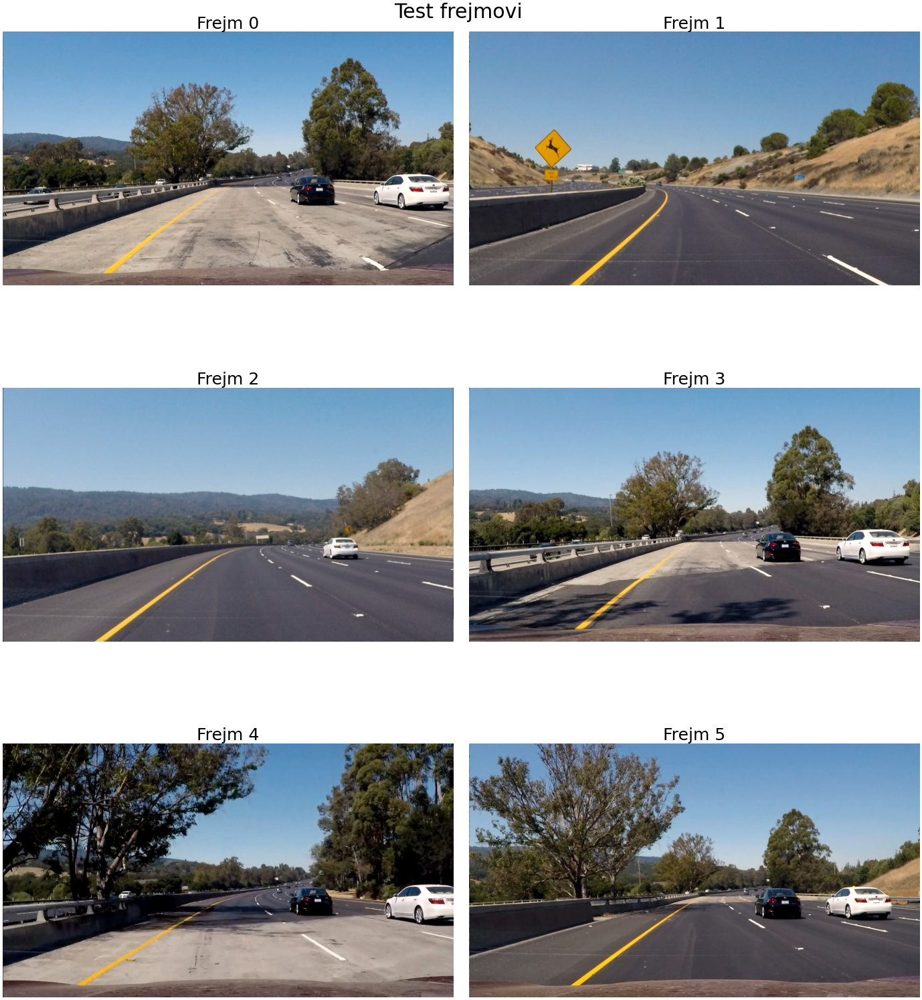

In [320]:
subplot_figsize = (35,40)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize
    
fig, ax = plt.subplots(len(test_frames) // 2, 2, figsize=subplot_figsize, dpi=40);
plt.tight_layout()

for i, frame in enumerate(test_frames):
    ax[i // 2, i % 2].imshow(frame)
    ax[i // 2, i % 2].axis('off')
    ax[i // 2, i % 2].set_title("Frejm " + str(i), fontsize=title_fontsize)
    
fig.suptitle("Test frejmovi", fontsize=suptitle_fontsize)

plt.show()

## Segmentacija
<hr>
Segmentaciju vršimo sa idejom da izdvojimo bele i žute trake. Pregledom test frejmova vidimo u kom se opsegu nalaze boje traka i na osnovu njih pravimo binarnu masku. Takva maska je daleko od savršene pa vršimo popravku morfološkim operacijama nad binarnom maskom. Prvo vršimo zatvaranje - nestajanje crnih praznina u belim regionima i povezivanje bliskih belih regiona. Zatim proširivanje belih regiona jer su neki delovi trake tanki i iseckani. Takvu masku prosleđujemo sledećem koraku - detekciji ivica.

In [321]:
def segment_lanes(img):
    white = (255, 255, 245)
    whiteish = (240, 220, 210)
    yellow = (200, 170, 0)
    yellowish = (255, 255, 140)

    kernel_closing = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (19, 19))
    kernel_dilation = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

    mask_yellow = cv2.inRange(img, yellow, yellowish)
    mask_white = cv2.inRange(img, whiteish, white)
    merged_mask = mask_white | mask_yellow
    closing = cv2.morphologyEx(merged_mask, cv2.MORPH_CLOSE, kernel_closing)
    dilation = cv2.dilate(closing, kernel_dilation, iterations=1)

    return dilation, closing, merged_mask, mask_white, mask_yellow

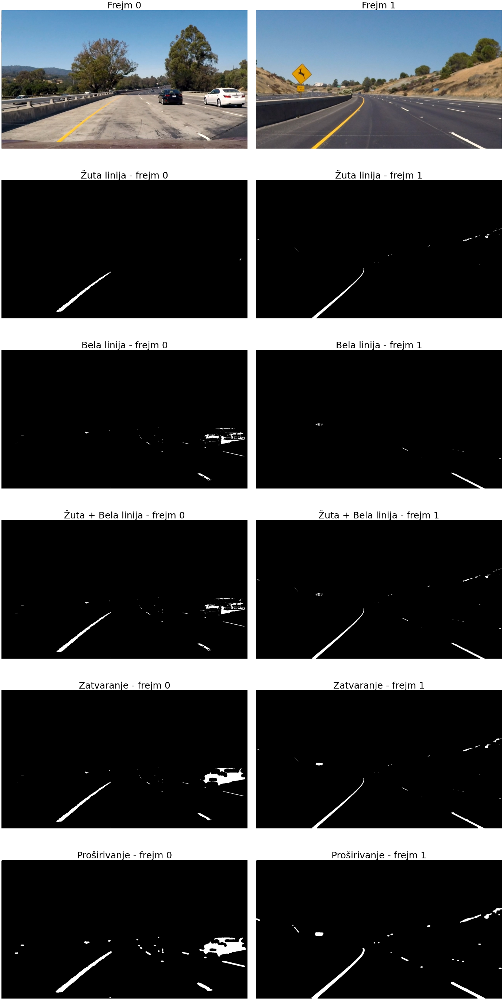

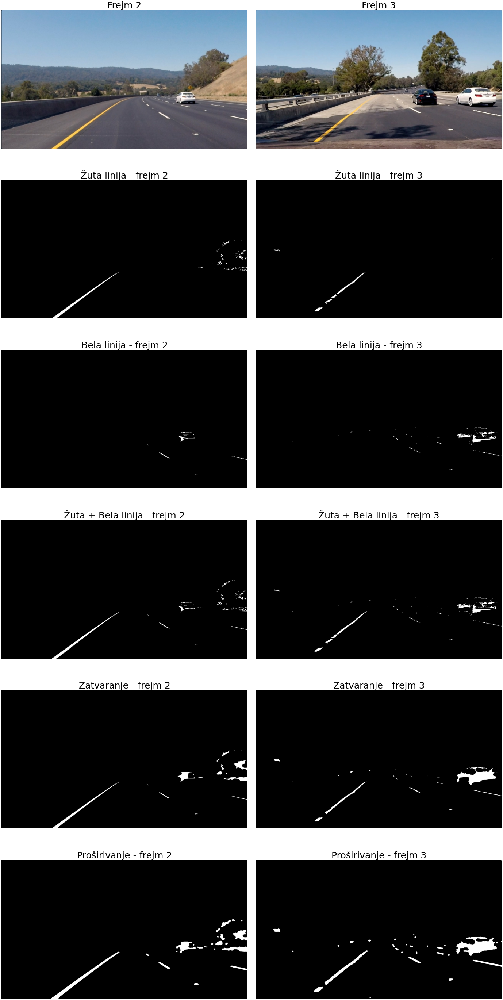

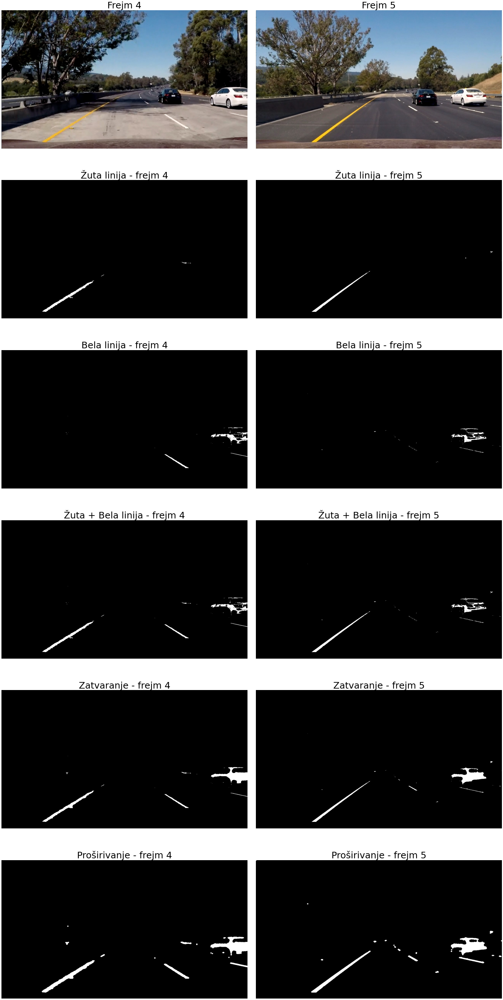

In [322]:

subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize
mask_names = ["Proširivanje", "Zatvaranje", "Žuta + Bela linija", "Bela linija", "Žuta linija"]

canny_inputs = []
for k in range(len(test_frames) // 2):
    fig, ax = plt.subplots(5 + 1, 2, figsize=subplot_figsize, dpi=40);
    plt.tight_layout()
    for i in range(2):
        frame_num = 2 * k + i
        frame = test_frames[frame_num]
        masks = segment_lanes(frame)
        
        # dilation kao input canny-ja
        canny_inputs.append(masks[0])

        ax[0, i % 2].imshow(frame)
        ax[0, i % 2].axis('off')
        ax[0, i % 2].set_title("Frejm " + str(frame_num), fontsize=title_fontsize)
        for j in range(len(masks)):
            ax[j + 1, i % 2].imshow(masks[::-1][j], cmap='gray')
            ax[j + 1, i % 2].axis('off')
            ax[j + 1, i % 2].set_title(mask_names[::-1][j] + " - frejm " + str(frame_num), fontsize=title_fontsize)


## Izdvajanje ivica - Canny-jev algoritam
<hr>

In [323]:
def canny_edge_detection(canny_input, threshold_low, threshold_high):
    gauss_kernel_size = 5
    img_filtered = cv2.GaussianBlur(canny_input, (gauss_kernel_size, gauss_kernel_size), 0)

    sobel_kernel_size = 3
    sobelx = cv2.Sobel(img_filtered, cv2.CV_64F, 1, 0, ksize=sobel_kernel_size)
    sobely = cv2.Sobel(img_filtered, cv2.CV_64F, 0, 1, ksize=sobel_kernel_size)

    sobel_ampsqr = sobelx ** 2 + sobely ** 2
    sobel_ampsqr = sobel_ampsqr / np.amax(sobel_ampsqr)
    edges = np.array(sobel_ampsqr)
    sobel_angle = np.arctan2(sobely, sobelx) / np.pi * 180

    bins = np.array([-200, -157.5, -112.5, -67.5, -22.5, 22.5, 67.5, 112.5, 157.5, 200])
    # digitize ce vratiti od 1 do 9 pa -5 je od -4 do 4 pa puta 45 je od -180 do 180 diskretno
    sobel_angle_discrete = (np.digitize(sobel_angle, bins) - 5) * 45
    sobel_angle_discrete[sobel_angle_discrete == -180] = 0
    sobel_angle_discrete[sobel_angle_discrete == 180] = 0
    sobel_angle_discrete[sobel_angle_discrete == -135] = 45
    sobel_angle_discrete[sobel_angle_discrete == -90] = 90
    sobel_angle_discrete[sobel_angle_discrete == -45] = 135

    row_idxs, col_idxs = np.nonzero(edges)
    
    # potiskivanje lokalnih nemaksimuma
    for cnt in range(len(row_idxs)):
        i = row_idxs[cnt]
        j = col_idxs[cnt]
        # provera da nismo kod ivica
        if i == 0 or j == 0 or i == edges.shape[0] - 1 or j == edges.shape[1] - 1:
            edges[i, j] = 0
            continue

        # vertikalna ivica -> horizontalno susedstvo
        if sobel_angle_discrete[i, j] == 0:
            if edges[i, j] != max(edges[i, j - 1], edges[i, j], edges[i, j + 1]):
                edges[i, j] = 0

        # ivica u desno po 45 -> susedstvo u levo po 45
        if sobel_angle_discrete[i, j] == 45:
            if edges[i, j] != max(edges[i - 1, j - 1], edges[i, j], edges[i + 1, j + 1]):
                edges[i, j] = 0

        # horizontalna ivica -> vertikalno susedstvo
        if sobel_angle_discrete[i, j] == 90:
            if edges[i, j] != max(edges[i - 1, j], edges[i, j], edges[i + 1, j]):
                edges[i, j] = 0

        # ivica u levo po 45 -> susedstvo u desno po 45
        if sobel_angle_discrete[i, j] == 135:
            if edges[i, j] != max(edges[i + 1, j - 1], edges[i, j], edges[i - 1, j + 1]):
                edges[i, j] = 0

    edges[edges > threshold_high] = 1
    edges[edges < threshold_low] = 0

    row_idxs, col_idxs = np.nonzero(edges)

    # slabe ivice
    for cnt in range(len(row_idxs)):
        i = row_idxs[cnt]
        j = col_idxs[cnt]
        # provera da nismo kod ivica
        if i == 0 or j == 0 or i == edges.shape[0] - 1 or j == edges.shape[1] - 1:
            edges[i, j] = 0
            continue

        if edges[i, j] == 1:
            continue

        neighbourhood = edges[i - 1:i + 2, j - 1:j + 2]
        if neighbourhood[neighbourhood == 1].size > 0:
            edges[i, j] = 1
        else:
            edges[i, j] = 0

    return edges, sobel_ampsqr, sobel_angle, sobel_angle_discrete


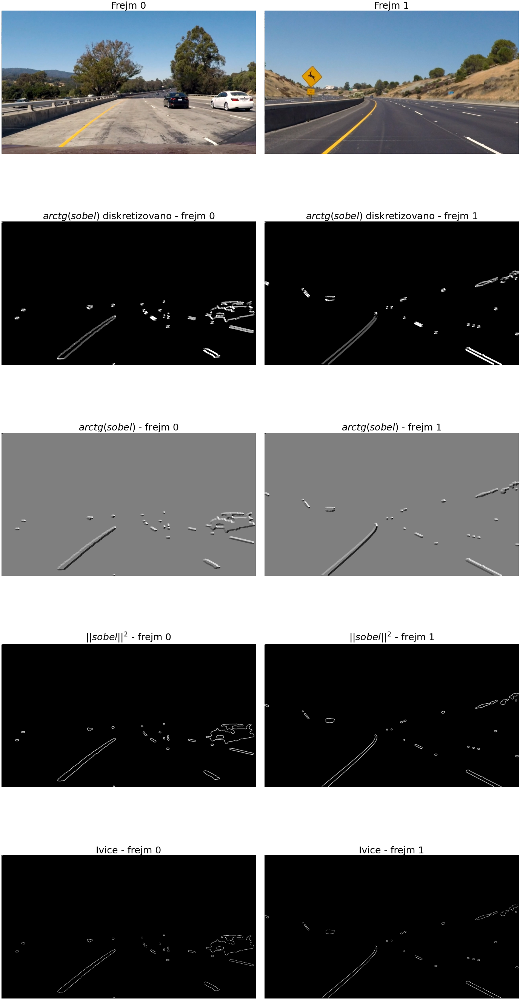

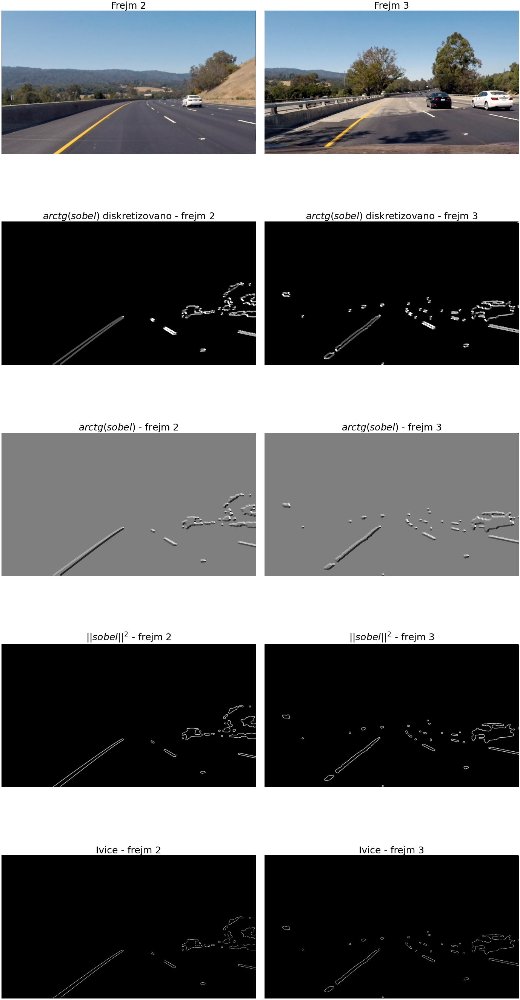

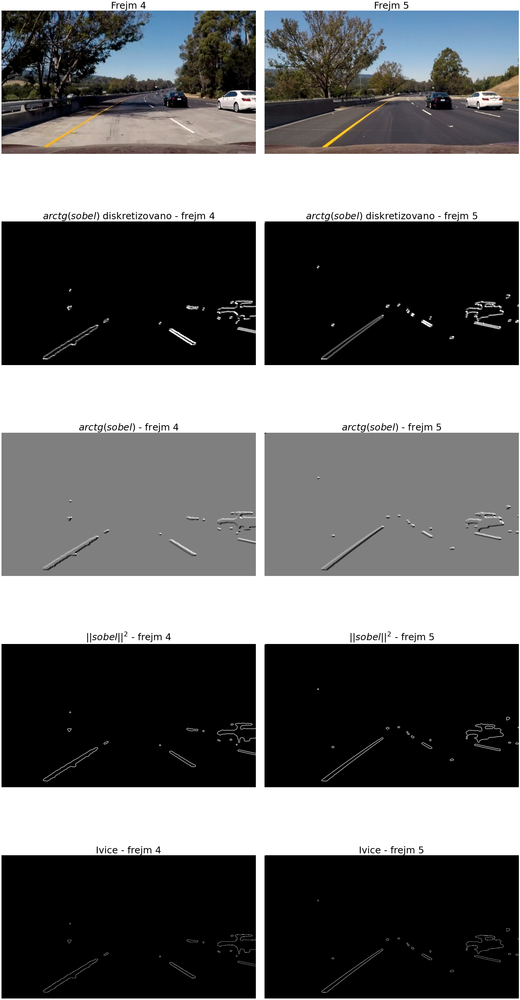

In [324]:
subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize
step_names = ["Ivice", "$||sobel||^2$", "$arctg(sobel)$", "$arctg(sobel)$ diskretizovano"]

threshold_low = 0.3
threshold_high = 0.6

canny_out = []
for k in range(len(test_frames) // 2):
    fig, ax = plt.subplots(4 + 1, 2, figsize=subplot_figsize, dpi=40);
    plt.tight_layout()
    for i in range(2):
        frame_num = 2 * k + i
        frame = test_frames[frame_num]
        canny_steps = canny_edge_detection(canny_inputs[frame_num], threshold_low, threshold_high)
        
        canny_out.append(canny_steps[0])
        
        ax[0, i % 2].imshow(frame)
        ax[0, i % 2].axis('off')
        ax[0, i % 2].set_title("Frejm " + str(frame_num), fontsize=title_fontsize)
        for j in range(len(canny_steps)):
            ax[j + 1, i % 2].imshow(canny_steps[::-1][j], cmap='gray')
            ax[j + 1, i % 2].axis('off')
            ax[j + 1, i % 2].set_title(step_names[::-1][j] + " - frejm " + str(frame_num), fontsize=title_fontsize)

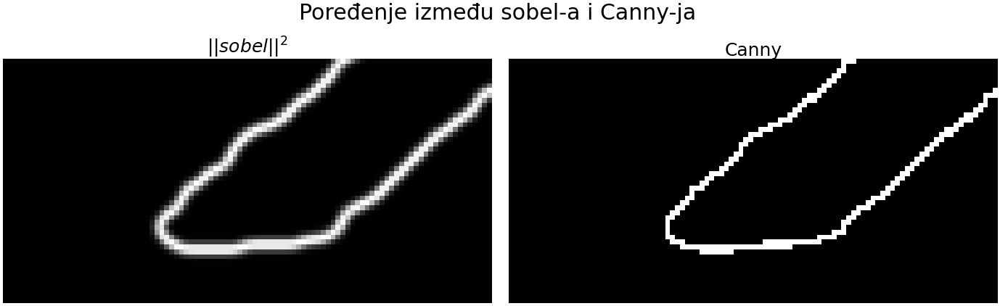

In [325]:
edges, sobel_ampsqr, sobel_angle, sobel_angle_discrete = canny_edge_detection(canny_inputs[0], threshold_low, threshold_high)

subplot_figsize = (35,13)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize


fig, ax = plt.subplots(1, 2, figsize=subplot_figsize, dpi=40);
plt.tight_layout()
ax[1].imshow(edges[650:700, 250:350], cmap='gray')
ax[1].axis("off")
ax[1].set_title("Canny", fontsize=title_fontsize)

ax[0].imshow(sobel_ampsqr[650:700, 250:350], cmap='gray')
ax[0].axis("off")
ax[0].set_title("$||sobel||^2$", fontsize=title_fontsize)

fig.suptitle("Poređenje između sobel-a i Canny-ja", fontsize=suptitle_fontsize)
plt.show()

Razlog toga što linije nisu uvek širine jedan potiče iz toga što smo tražili ivice binarne slike. Naime, desilo se da su pikseli jedan pored drugog jednaki i stoga ne postoji lokalni maksimum i svi pikseli su zadržani.

## Hough-ova transformacija i prave
<hr>

In [326]:
def dist(x1, y1, x2, y2):
    return np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

In [327]:
class MyLine:
    def __init__(self, x, y, slope):
        self.x = x
        self.y = y
        self.slope = slope

    def plotLine(self, color):
        plt.axline((self.x, self.y), color=color, slope=self.slope)
        
    def plotPoint(self, color, marker):
        plt.plot(self.x, self.y, color=color, marker=marker)

    def getYatX(self, x):
        return self.y + self.slope * (x - self.x)

In [328]:
class LineSegment:
    def __init__(self, x_start, x_end, y_start, y_end):
        self.x_start = x_start
        self.x_end = x_end

        self.y_start = y_start
        self.y_end = y_end

        self.length = -1
        self.slope = 0
        self.calcParams()

    def calcParams(self):
        self.length = dist(self.x_start, self.y_start, self.x_end, self.y_end)
        if self.x_end != self.x_start:
            self.slope = (self.y_end - self.y_start) / (self.x_end - self.x_start)
        else:
            self.slope = np.inf

    def dist2point(self, x, y):
        return min(dist(self.x_start, self.y_start, x, y), dist(self.x_end, self.y_end, x, y))

    def addPoint(self, x, y):
        self.x_end = x
        self.y_end = y
        self.calcParams()

    def plotSegment(self,ax, color, linewidth):
        ax.plot([self.x_start, self.x_end], [self.y_start, self.y_end], color=color, linewidth=linewidth)

In [329]:
def lines_are_touching(left, right):
    if left.x_start == right.x_end and left.y_start == right.y_end:
        return True
    elif left.x_end == right.x_start and left.y_end == right.y_start:
        return True
    else:
        return False

In [330]:
def make_lines(xx, yy, slope):
    lines = []
    for i in range(len(xx)):
        lines.append(MyLine(xx[i], yy[i], slope[i]))
    return lines

In [331]:
def get_hough_lines(image, theta_limits, num_points):
    tested_angles = np.linspace(theta_limits[0], theta_limits[1], num_points, endpoint=False)
    h, theta, d = hough_line(image, theta=tested_angles)

    num_peaks = 2
    x0 = np.zeros(num_peaks)
    y0 = np.zeros(num_peaks)
    slope = np.zeros(num_peaks)
    i = 0
    for _, angle, dist in zip(*hough_line_peaks(h, theta, d, num_peaks=num_peaks)):
        (x0[i], y0[i]) = dist * np.array([np.cos(angle), np.sin(angle)])
        slope[i] = np.tan(angle + np.pi / 2)
        i += 1

    return x0, y0, slope

In [332]:
def get_lines(edges, theta_limits_left, theta_limits_right, num_points):
    left_line_params = get_hough_lines(edges, theta_limits_left, num_points)
    right_line_params = get_hough_lines(edges, theta_limits_right, num_points)

    left_lines = make_lines(*left_line_params)
    right_lines = make_lines(*right_line_params)
    lines = right_lines + left_lines

    return lines, left_lines, right_lines

In [333]:
num_points = 100
theta_limits_left = [np.pi / 4, 3 * np.pi / 8]
theta_limits_right = [- 3 * np.pi / 8, -np.pi / 4]

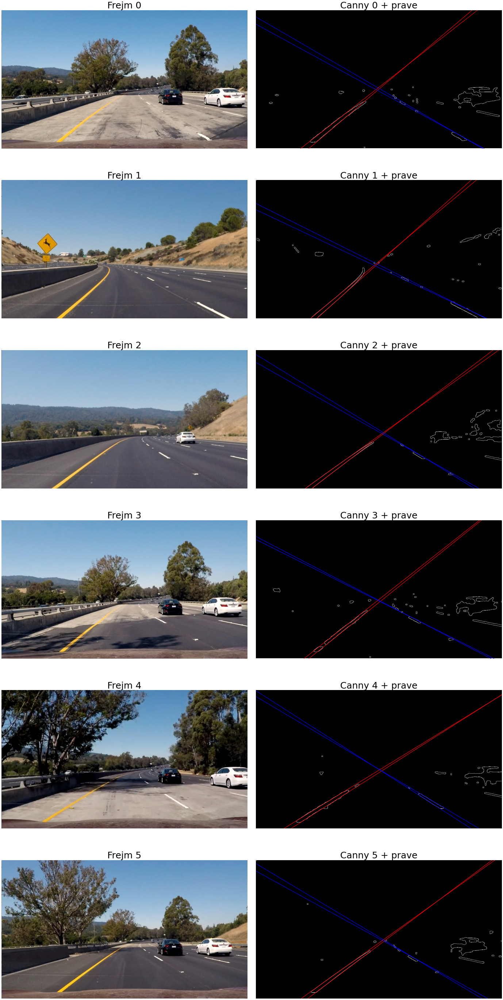

In [334]:
subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize

num_lines = 2

fig, ax = plt.subplots(len(test_frames), 2, figsize=subplot_figsize, dpi=40);
plt.tight_layout()
for i in range(len(test_frames)):
    lines, left_lines, right_lines = get_lines(canny_out[i], theta_limits_left, theta_limits_right, num_points)
    
    ax[i, 0].imshow(test_frames[i])
    ax[i, 0].axis("off")
    ax[i, 0].set_title("Frejm " + str(i), fontsize=title_fontsize)
    
    ax[i, 1].imshow(canny_out[i], cmap='gray')
    ax[i, 1].axis("off")
    ax[i, 1].set_title("Canny " + str(i) + " + prave", fontsize=title_fontsize)
    
    for j in range(num_lines):
        ax[i, 1].axline((left_lines[j].x, left_lines[j].y), color='r', slope=left_lines[j].slope, linewidth=2)
        ax[i, 1].axline((right_lines[j].x, right_lines[j].y), color='b', slope=right_lines[j].slope, linewidth=2)
    ax[i, 1].set_ylim(canny_out[i].shape[0], 0)    
    ax[i, 1].set_xlim(0, canny_out[i].shape[1])

plt.show()


## Pronalaženje segmenata
<hr>

In [335]:
def make_4d_array_custom(arr_padded, N, M, a, b):
    return as_strided(arr_padded, shape=(N, M, a, b), strides=arr_padded.strides * 2)

In [336]:
def get_line_segments(edges, lines, min_size, max_gaps, tolerancy):
    all_points_j = []
    all_points_i = []
    segments = []
    for line in lines:
        r = tolerancy
        img_padded = np.pad(edges, ((r, r), (r, r)),
                            mode="constant")
        image_4d = make_4d_array_custom(img_padded, edges.shape[0], edges.shape[1], 2 * r + 1,
                                        2 * r + 1)
        points_j = []
        points_i = []
        for j in range(edges.shape[1]):
            y = line.getYatX(j)
            i = round(y)
            if i < 0 or i > edges.shape[0] - 1:
                continue

            if np.count_nonzero(image_4d[i, j]) > 0:
                points_j.append(j)
                points_i.append(i)

        for cnt in range(len(points_j)):
            if cnt == 0:
                seg = LineSegment(x_start=points_j[0], x_end=points_j[0], y_start=points_i[0], y_end=points_i[0])

            if seg.dist2point(points_j[cnt], points_i[cnt]) < max_gaps:
                seg.addPoint(points_j[cnt], points_i[cnt])
            else:
                if seg.length > min_size:
                    segments.append(seg)
                seg = LineSegment(x_start=points_j[cnt], x_end=points_j[cnt], y_start=points_i[cnt],
                                  y_end=points_i[cnt])
        if len(points_j) == 0:
            continue
        if seg.length > min_size:
            segments.append(seg)
        seg = []
        all_points_j = all_points_j + points_j
        all_points_i = all_points_i + points_i

    return segments, all_points_j, all_points_i

In [337]:
tolerancy = 3
min_size = 30
max_gaps = 35

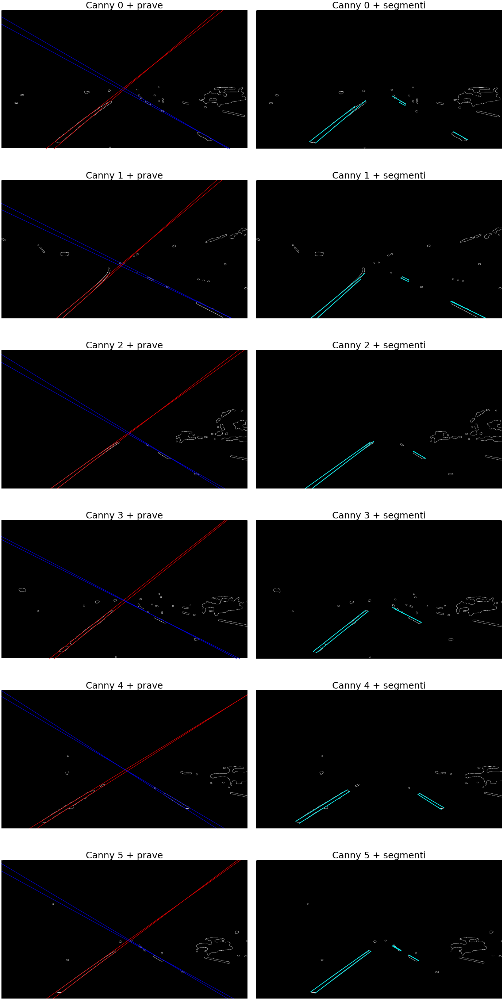

In [338]:
subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize


fig, ax = plt.subplots(len(test_frames), 2, figsize=subplot_figsize, dpi=40);
plt.tight_layout()
for i in range(len(test_frames)):
    lines, left_lines, right_lines = get_lines(canny_out[i], theta_limits_left, theta_limits_right, num_points)
    segments, all_points_j, all_points_i = get_line_segments(canny_out[i], lines, min_size, max_gaps, tolerancy)

    ax[i, 1].imshow(canny_out[i], cmap='gray')
    ax[i, 1].axis("off")
    ax[i, 1].set_title("Canny " + str(i) + " + segmenti", fontsize=title_fontsize)
    
    for seg in segments:
        seg.plotSegment(ax=ax[i, 1], color='cyan', linewidth=3)
    
    ax[i, 0].imshow(canny_out[i], cmap='gray')
    ax[i, 0].axis("off")
    ax[i, 0].set_title("Canny " + str(i) + " + prave", fontsize=title_fontsize)
    
    for j in range(num_lines):
        ax[i, 0].axline((left_lines[j].x, left_lines[j].y), color='r', slope=left_lines[j].slope, linewidth=2)
        ax[i, 0].axline((right_lines[j].x, right_lines[j].y), color='b', slope=right_lines[j].slope, linewidth=2)
    ax[i, 0].set_ylim(canny_out[i].shape[0], 0)    
    ax[i, 0].set_xlim(0, canny_out[i].shape[1])

In [339]:
def merge_segments(segments):
    x_max_length = [0, 0]
    y_max_length = [0, 0]
    max_length = 0
    for s1 in segments:
        for s2 in segments:
            length = dist(s1.x_start, s1.y_start, s2.x_end, s2.y_end)
            if length > max_length:
                max_length = length
                x_max_length = [s1.x_start, s2.x_end]
                y_max_length = [s1.y_start, s2.y_end]

    x1 = x_max_length[0]
    x2 = x_max_length[1]

    y1 = y_max_length[0]
    y2 = y_max_length[1]

    return x1, y1, x2, y2


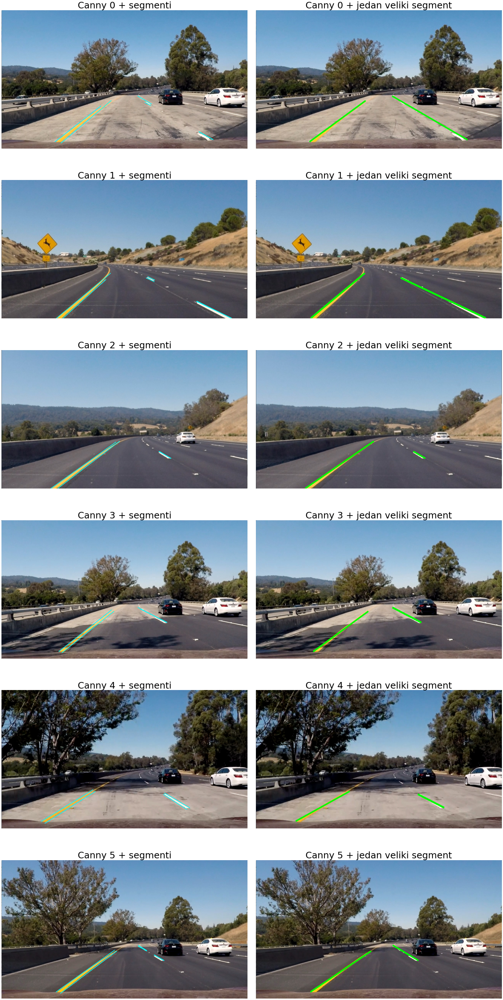

In [340]:
subplot_figsize = (35,70)
title_fontsize = 45
suptitle_fontsize = 1.2 * title_fontsize


fig, ax = plt.subplots(len(test_frames), 2, figsize=subplot_figsize, dpi=40);
plt.tight_layout()
for i in range(len(test_frames)):
    lines, left_lines, right_lines = get_lines(canny_out[i], theta_limits_left, theta_limits_right, num_points)
    segments, all_points_j, all_points_i = get_line_segments(canny_out[i], lines, min_size, max_gaps, tolerancy)
    
    right_segments = []
    left_segments = []
    for seg in segments:
        if np.sign(seg.slope) == np.sign(right_lines[0].slope):
            right_segments.append(seg)
        elif np.sign(seg.slope) == np.sign(left_lines[0].slope):
            left_segments.append(seg)
    
    right_line_coords = merge_segments(right_segments)
    left_line_coords = merge_segments(left_segments)
    
#     stacked_img = np.stack((canny_out[i],) * 3, axis=-1)
#     im = Image.fromarray(np.uint8(stacked_img * 255))
    im = Image.fromarray(test_frames[i])
    draw = ImageDraw.Draw(im)
    
    draw.line(right_line_coords, fill=(0, 255, 0, 255), width=9)
    draw.line(left_line_coords, fill=(0, 255, 0, 255), width=9)

    img_lines_drawn = np.asarray(im)

    ax[i, 0].imshow(test_frames[i], cmap='gray')
    ax[i, 0].axis("off")
    ax[i, 0].set_title("Canny " + str(i) + " + segmenti", fontsize=title_fontsize)
    
    for seg in segments:
        seg.plotSegment(ax=ax[i, 0], color='cyan', linewidth=3)
    
    ax[i, 1].imshow(img_lines_drawn)
    ax[i, 1].axis("off")
    ax[i, 1].set_title("Canny " + str(i) + " + jedan veliki segment", fontsize=title_fontsize)
    
    

## Obrada video snimka
<hr>
Procenat obrađenosti video snimka dat je ispod. Na mom računaru je to oko 7 minuta.

In [341]:
def fix_coordinates(x1, y1, x2, y2, h1, h2):
    if x2 == x1:
        return x1, y1, x2, y2
    slope = (y2 - y1) / (x2 - x1)
    
    if slope == 0:
        return x1, y1, x2, y2
    xh1 = (h1 - y1) / slope + x1
    xh2 = (h2 - y1) / slope + x1
    
    return xh1, h1, xh2, h2

In [342]:
h1 = 670
h2 = 470
do_video = True
whole_video_flag = True
print_percent_flag = True
time_flag = True
num_frames = 50
videodata = skvideo.io.vread("sekvence/video_road.mp4")

if do_video:

    if whole_video_flag:
        frames_range = videodata.shape[0]
    else:
        frames_range = num_frames

    new_video = np.zeros_like(videodata[:frames_range])

    if time_flag:
        start = time.perf_counter()
        
    
    for i in range(frames_range):
        dilation, _, _, _, _ = segment_lanes(videodata[i])
        edges, _, _, _ = canny_edge_detection(dilation, threshold_low,
                                              threshold_high)

        lines, _, _ = get_lines(edges, theta_limits_left, theta_limits_right, num_points)
        segments, _, _ = get_line_segments(edges, lines, min_size, max_gaps, tolerancy)

        right_segments = []
        left_segments = []
        for seg in segments:
            if np.sign(seg.slope) == np.sign(right_lines[0].slope):
                right_segments.append(seg)
            elif np.sign(seg.slope) == np.sign(left_lines[0].slope):
                left_segments.append(seg)

        im = Image.fromarray(videodata[i])
        draw = ImageDraw.Draw(im)

        right_line_coords = merge_segments(right_segments)
        left_line_coords = merge_segments(left_segments)

        draw.line(right_line_coords, fill=(0, 255, 0, 255), width=9)
        draw.line(left_line_coords, fill=(0, 255, 0, 255), width=9)
        
#         xr1, yr1, xr2, yr2 = merge_segments(right_segments)
#         right_line_coords_fixed = fix_coordinates(xr1, yr1, xr2, yr2, h1, h2)
        
        
#         xl1, yl1, xl2, yl2 = merge_segments(left_segments)
#         left_line_coords_fixed = fix_coordinates(xl1, yl1, xl2, yl2, h1, h2)
        

#         draw.line(right_line_coords_fixed, fill=(0, 255, 0, 255), width=9)
#         draw.line(left_line_coords_fixed, fill=(0, 255, 0, 255), width=9)
        

        new_video[i, :, :, :] = np.asarray(im)
        if i % 50 == 0 and print_percent_flag:
            print("%3.1f" % ((i + 1) / frames_range * 100), " %", end="\r")

    if time_flag:
        print("Vreme obrade videa: " + "%0.4f" % (time.perf_counter() - start) + " sec")

Vreme obrade videa: 561.6144 sec


In [343]:
 if time_flag:
    start = time.perf_counter()
    imageio.mimwrite(os.getcwd() + '\\sekvence\\out_vid.mp4', new_video, fps=24.0)
if time_flag:
    print("Vreme čuvanja videa: " + "%0.4f" % (time.perf_counter() - start) + " sec")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (480, 360) to (480, 368) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Vreme čuvanja videa: 21.3502 sec


Apdejtovanje numerisanja jednačina

In [344]:
%%javascript
MathJax.Hub.Queue(
  ["resetEquationNumbers", MathJax.InputJax.TeX],
  ["PreProcess", MathJax.Hub],
  ["Reprocess", MathJax.Hub]
);

<IPython.core.display.Javascript object>